<a href="https://colab.research.google.com/github/TejasMundada26/k-means-clustering-epoch-spring-camp/blob/main/k_means_clustering_py.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# K-Means Clustering
 - by Tejas Mundada

# Important libraries

In [ ]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt

# Extracting the data

In [ ]:
df=pd.read_csv("clustering_data.csv")

<ipython-input-78-c3ef6607ad87>:1: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("clustering_data.csv")


# Extracting the data of Maharashtra

In [ ]:
# My home state is "Maharashtra"
maharashtra_df=df[df['StateName']=='MAHARASHTRA']

# there was some error in the data. It has some strings which cannot be converted to float,
# so I have taken the help of ChatGPT to solve the issue

maharashtra_df['Latitude'] = pd.to_numeric(maharashtra_df['Latitude'], errors='coerce')
maharashtra_df['Longitude'] = pd.to_numeric(maharashtra_df['Longitude'], errors='coerce')

maharashtra_df = maharashtra_df.dropna(subset=['Latitude', 'Longitude'])

maharashtra_df = maharashtra_df.drop_duplicates(subset=['Latitude', 'Longitude'])

coords=maharashtra_df[['Latitude','Longitude']].to_numpy()

(7677, 2)


<ipython-input-89-532266e38450>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maharashtra_df['Latitude'] = pd.to_numeric(maharashtra_df['Latitude'], errors='coerce')
<ipython-input-89-532266e38450>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maharashtra_df['Longitude'] = pd.to_numeric(maharashtra_df['Longitude'], errors='coerce')


#Plotting the map

In [ ]:
map_maharashtra=folium.Map(location=[19.7515,75.7139], zoom_start=7)

for _, row in maharashtra_df.iterrows():
  folium.Marker(
      location=[row['Latitude'], row['Longitude']],
      popup=f"{row.get('DistrictName','')}",
      icon=folium.Icon(color='red', icon='info_sign')
  ).add_to(map_maharashtra)

map_maharashtra

**Plotting the graph is taking a lot of time may be due to the large data.
 I request you to please run this cell before evaluating ( due to shortage of time I have not run the following 3 cells)**

#Plotting the graph

In [ ]:

for i in range(len(coords)):
  plt.scatter(coords[i][1],coords[i][0])

plt.show()

#Refining the data

In [ ]:
# putting the bounds to get the data of Maharashtra only
coords = coords[(coords[:,0]<=23) & (coords[:,0]>=15) & (coords[:,1]<=81) & (coords[:,1]>=72)]

# Plotting the graph

In [ ]:
for i in range(len(coords)):
  plt.scatter(coords[i][0],coords[i][1])

plt.show()

#Function for Euclidean distance

In [ ]:
def euclidean_distance(x1,x2):
  return np.sqrt(np.sum((x1-x2)**2))

#Class

In [ ]:
class K_Means:
  def __init__(self,k=5,maxitr=500,plot_steps=False):
    self.k=k
    self.maxitr=maxitr
    self.plot_steps=plot_steps  # to plot steps after every step

    # list of sample indices for each cluster
    self.clusters=[[] for _ in range(self.k)]

    #the centers for each cluster
    self.centroids=[]

  def predict(self,X):
    self.X=X
    self.n_samples, self.n_features = X.shape

    #initializing
    np.random.seed(42)
    random_sample_idxs=np.random.choice(self.n_samples, self.k, replace=False)
    self.centroids=[self.X[idx] for idx in random_sample_idxs]

    #optimizing the clusters
    for _ in range(self.maxitr):

      #assign samples to closest centroids
      self.clusters=self._create_clusters(self.centroids)

      if self.plot_steps:
        self.plot()

      #calcuting the centroids
      centroids_old=self.centroids
      self.centroids=self._get_centroids(self.clusters)

      if self._is_converged(centroids_old,self.centroids):
        break

      if self.plot_steps:
        self.plot()

    # classify samples as the index of their clusters
      return self._get_cluster_labels(self.clusters)

  def _get_cluster_labels(self,clusters):
        labels=np.empty(self.n_samples)
        for cluster_idx, cluster in enumerate(clusters):
          for sample_idx in cluster:
            labels[sample_idx]=cluster_idx

        return labels

  # function to create clusters
  def _create_clusters(self,centroids):
        clusters=[[] for _ in range(self.k)]
        for idx, sample in enumerate(self.X):
          centroid_idx=self._closest_centroid(sample, centroids)
          clusters[centroid_idx].append(idx)

        return clusters

  # function to find the closest centroid
  def _closest_centroid(self, sample, centroids):
         distances=[euclidean_distance(sample, point) for point in centroids]
         closest_idx=np.argmin(distances)

         return closest_idx

   #function to return centroids
  def _get_centroids(self, clusters):
        centroids=np.zeros((self.k, self.n_features))
        for cluster_idx, cluster in enumerate(clusters):
          cluster_mean=np.mean(self.X[cluster], axis=0)
          centroids[cluster_idx] = cluster_mean

        return centroids

  # function to check convergence
  def _is_converged(self, centroids_old, centroids):
         distances=[euclidean_distance(centroids_old[i], centroids[i]) for i in range(self.k)]
         return sum(distances)==0

  #function for plotting the graph at every step
  def plot(self):
         fig, ax=plt.subplots(figsize=(12,8))

         for i, index in enumerate(self.clusters):
          point=self.X[index].T
          ax.scatter(*point)

         for point in self.centroids:
          ax.scatter(*point, marker='x', color='black', linewidth=2)

         plt.show()



#Implementing..

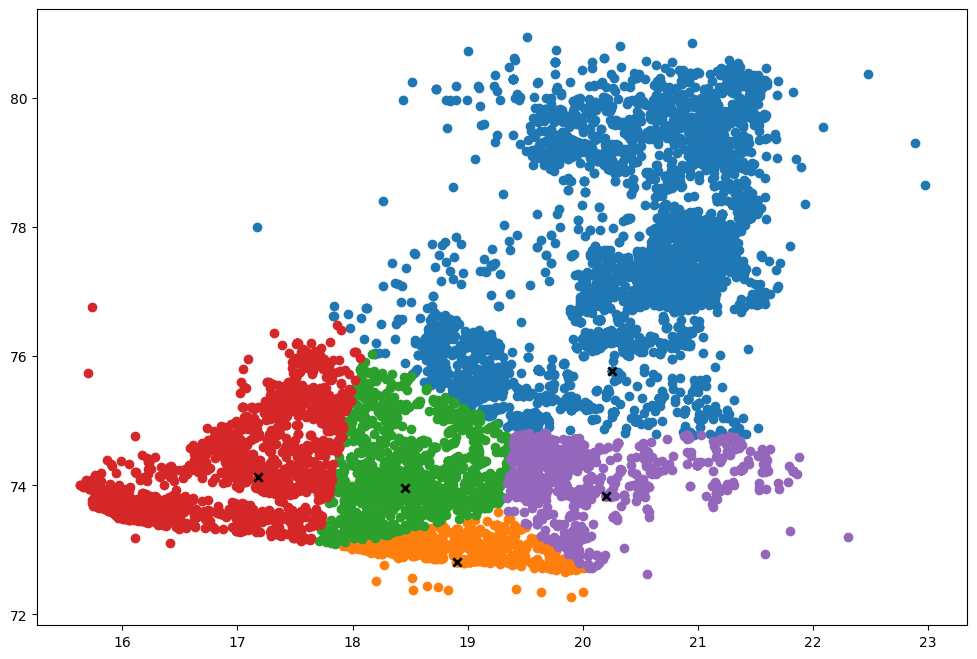

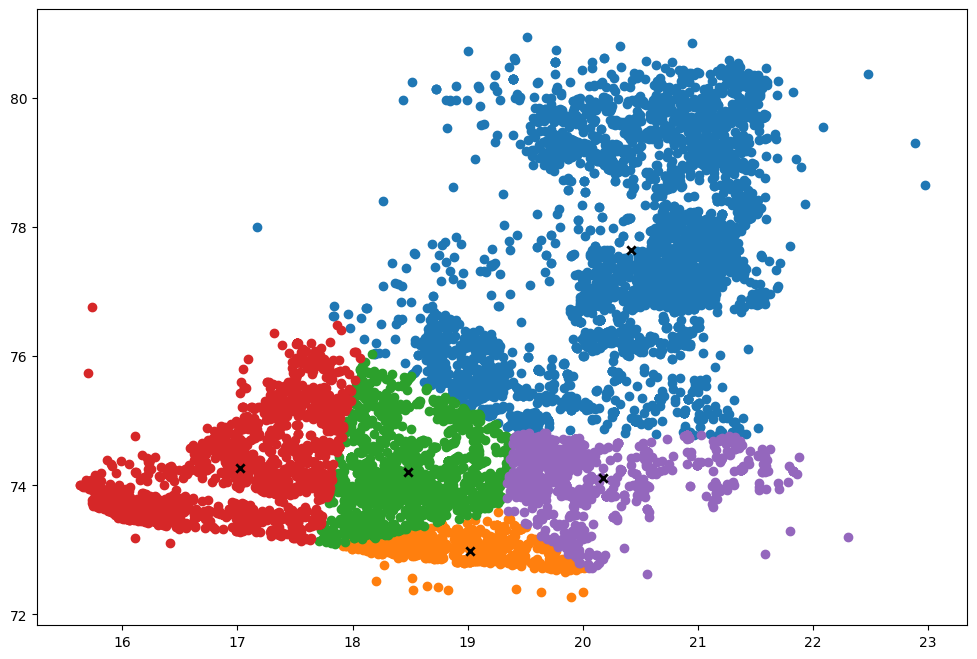

In [ ]:
clf = K_Means(5, maxitr=1000, plot_steps=True)
predictions=clf.predict(coords)